[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JeisGonzalez/Challenge-Alura-Store/blob/main/AluraStoreLatam.ipynb)


### Importación de datos

In [66]:
import pandas as pd

tienda1 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv")
tienda2 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv")
tienda3 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv")
tienda4 = pd.read_csv("https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv")

In [67]:
tienda1["Tienda"] = 1
tienda2["Tienda"] = 2
tienda3["Tienda"] = 3
tienda4["Tienda"] = 4

df_unificado = pd.concat([tienda1, tienda2, tienda3, tienda4], ignore_index=True)
df_unificado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9435 entries, 0 to 9434
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                9435 non-null   object 
 1   Categoría del Producto  9435 non-null   object 
 2   Precio                  9435 non-null   float64
 3   Costo de envío          9435 non-null   float64
 4   Fecha de Compra         9435 non-null   object 
 5   Vendedor                9435 non-null   object 
 6   Lugar de Compra         9435 non-null   object 
 7   Calificación            9435 non-null   int64  
 8   Método de pago          9435 non-null   object 
 9   Cantidad de cuotas      9435 non-null   int64  
 10  lat                     9435 non-null   float64
 11  lon                     9435 non-null   float64
 12  Tienda                  9435 non-null   int64  
dtypes: float64(4), int64(3), object(6)
memory usage: 958.4+ KB


#1. Análisis de facturación

In [68]:
def calcular_ingreso_por_tienda(df: pd.DataFrame) -> pd.DataFrame:
  ingreso_por_tienda = (df.groupby("Tienda")["Precio"].sum().reset_index(name="Ingreso"))
  pd.options.display.float_format = '{:,.0f}'.format
  return ingreso_por_tienda

ingreso_por_tienda = calcular_ingreso_por_tienda(df_unificado)
ingreso_por_tienda

,Tienda,Ingreso
0,1,"1,150,880,400"
1,2,"1,116,343,500"
2,3,"1,098,019,600"
3,4,"1,038,375,700"


#2. Ventas por categoría

In [69]:
def calcular_ventas_por_categoria(df: pd.DataFrame) -> pd.DataFrame:
  ventas_por_categoria = (
    df.groupby(["Tienda", "Categoría del Producto"]).size().reset_index(name="Cantidad de productos vendidos")
    .sort_values(["Tienda", "Cantidad de productos vendidos"], ascending=[True, False])
  )
  return ventas_por_categoria

ventas_por_categoria = calcular_ventas_por_categoria(df_unificado)
ventas_por_categoria

,Tienda,Categoría del Producto,Cantidad de productos vendidos
7,1,Muebles,465
3,1,Electrónicos,448
5,1,Juguetes,324
2,1,Electrodomésticos,312
1,1,Deportes y diversión,284
4,1,Instrumentos musicales,182
6,1,Libros,173
0,1,Artículos para el hogar,171
15,2,Muebles,442
11,2,Electrónicos,422


In [70]:
#Top 3 por tienda

def top3_categorias(df: pd.DataFrame) -> pd.DataFrame:
  top5_por_tienda = (ventas_por_categoria.groupby("Tienda").head(3).reset_index(drop=True))
  return top5_por_tienda

top5_por_tienda = top3_categorias(ventas_por_categoria)
top5_por_tienda

,Tienda,Categoría del Producto,Cantidad de productos vendidos
0,1,Muebles,465
1,1,Electrónicos,448
2,1,Juguetes,324
3,2,Muebles,442
4,2,Electrónicos,422
5,2,Juguetes,313
6,3,Muebles,499
7,3,Electrónicos,451
8,3,Juguetes,315
9,4,Muebles,480


# 3. Calificación promedio de la tienda

In [71]:
def calcular_calificaciones_promedio(df: pd.DataFrame) -> pd.DataFrame:
  calificacion_stats = (df.groupby("Tienda")
    .agg(Calificación_promedio=("Calificación", "mean"), Cantidad_resenas=("Calificación", "count"))
    .reset_index())
  calificacion_stats["Calificación_promedio"] = calificacion_stats["Calificación_promedio"].round(3)
  return calificacion_stats

calificaciones = calcular_calificaciones_promedio(df_unificado)
calificaciones

,Tienda,Calificación_promedio,Cantidad_resenas
0,1,4,2359
1,2,4,2359
2,3,4,2359
3,4,4,2358


# 4. Productos más y menos vendidos

In [72]:
def productos_mas_y_menos_vendidos(df: pd.DataFrame, top_n=3) -> pd.DataFrame:

  ventas_por_producto = (
    df.groupby(["Tienda", "Producto"])
    .size()
    .reset_index(name="Cantidad_vendida")
  )

  productos_top = (
    ventas_por_producto
    .sort_values(["Tienda", "Cantidad_vendida"], ascending=[True, False])
    .groupby("Tienda")
    .head(top_n)
    .reset_index(drop=True)
  )

  productos_bottom = (
    ventas_por_producto
    .sort_values(["Tienda", "Cantidad_vendida"], ascending=[True, True])
    .groupby("Tienda")
    .head(top_n)
    .reset_index(drop=True)
  )
  return productos_top, productos_bottom

productos_top, productos_bottom = productos_mas_y_menos_vendidos(df_unificado)
print(productos_top)
print(productos_bottom)

    Tienda                   Producto  Cantidad_vendida
0        1                    Armario                60
1        1                 Microondas                60
2        1              TV LED UHD 4K                60
3        2  Iniciando en programación                65
4        2                 Microondas                62
5        2                    Batería                61
6        3              Kit de bancas                57
7        3                  Cama king                56
8        3            Mesa de comedor                56
9        4                   Cama box                62
10       4                 Cubertería                59
11       4                  Cama king                56
    Tienda                   Producto  Cantidad_vendida
0        1  Auriculares con micrófono                33
1        1               Celular ABXY                33
2        1            Olla de presión                35
3        2              Juego de mesa           

# 5. Envío promedio por tienda

In [73]:
def costo_envio_promedio(df: pd.DataFrame) -> pd.DataFrame:
  costo_envio_stats = (
    df.groupby("Tienda")
    .agg(
      Costo_envio_promedio=("Costo de envío", "mean"),
      Costo_envio_total=("Costo de envío", "sum"),
      Cantidad_envios=("Costo de envío", "count")
    ).reset_index())
  costo_envio_stats["Costo_envio_promedio"] = costo_envio_stats["Costo_envio_promedio"].round(3)
  costo_envio_stats["Costo_envio_total"] = costo_envio_stats["Costo_envio_total"].round(3)
  pd.options.display.float_format = '{:,.3f}'.format
  return costo_envio_stats

df_costo = costo_envio_promedio(df_unificado)
df_costo

,Tienda,Costo_envio_promedio,Costo_envio_total,Cantidad_envios
0,1,"26,018.610","61,377,900.000",2359
1,2,"25,216.236","59,485,100.000",2359
2,3,"24,805.680","58,516,600.000",2359
3,4,"23,459.457","55,317,400.000",2358


# 6. Visualización

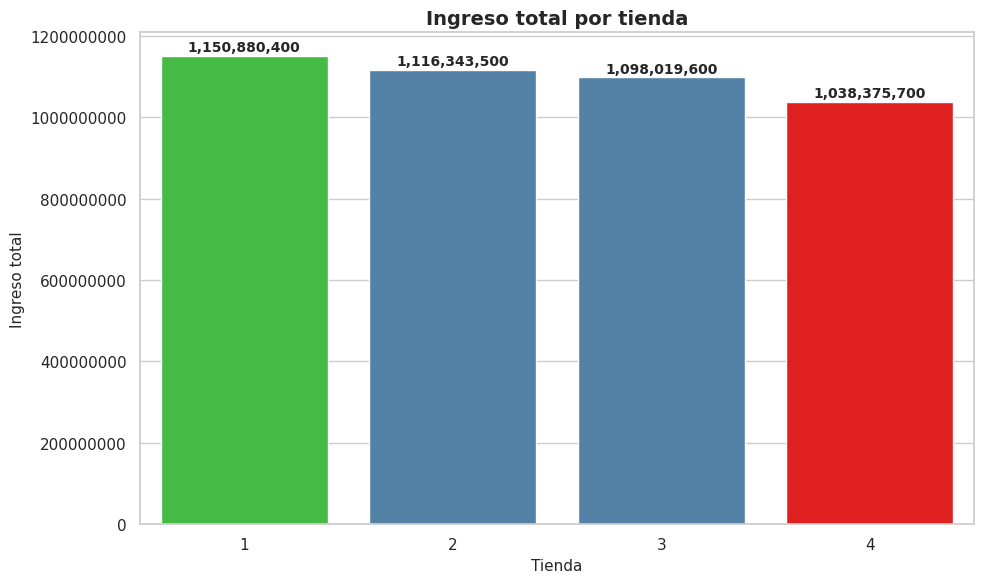

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

def graficar_ingreso_por_tienda(df: pd.DataFrame) -> None:
  pd.options.display.float_format = '{:,.0f}'.format
  tienda_min = df.loc[df["Ingreso"].idxmin(), "Tienda"]
  tienda_max = df.loc[df["Ingreso"].idxmax(), "Tienda"]

  def asignar_color(tienda):
    if tienda == tienda_min:
      return "red"
    elif tienda == tienda_max:
      return "limegreen"
    else:
      return "steelblue"

  df = df.copy()
  df["Color"] = df["Tienda"].apply(asignar_color)
  plt.figure(figsize=(10,6))

  ax = sns.barplot(
    data=df,
    x="Tienda",
    y="Ingreso",
    hue="Color",
    palette={"red": "red", "limegreen": "limegreen", "steelblue": "steelblue"},
    dodge=False,
    legend=False
  )

  plt.title("Ingreso total por tienda", fontsize=14, weight="bold")
  plt.xlabel("Tienda", fontsize=11)
  plt.ylabel("Ingreso total", fontsize=11)
  plt.xticks(rotation=0)
  ax.get_yaxis().get_major_formatter().set_scientific(False)

  for i, p in enumerate(ax.patches):
    valor = df.iloc[i]["Ingreso"]
    ax.text(
      p.get_x() + p.get_width() / 2,
      p.get_height() + (0.01 * df["Ingreso"].max()),
      f"{valor:,.0f}",
      ha="center",
      fontsize=10,
      weight="bold"
    )

  plt.tight_layout()
  plt.show()

graficar_ingreso_por_tienda(ingreso_por_tienda)

In [75]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def graficar_satisfaccion_tiendas(df: pd.DataFrame) -> None:
  colores = ['#ff4d4d', '#ffa64d', '#ffff66', '#99e699', '#33cc33']
  num_tiendas = len(df)
  num_cols = 4
  num_rows = -(-num_tiendas // num_cols)

  fig = make_subplots(
    rows=num_rows,
    cols=num_cols,
    subplot_titles=[f"Tienda {int(t)}" for t in df["Tienda"]],
    specs=[[{'type': 'indicator'}] * num_cols for _ in range(num_rows)],
  )

  for i, (_, row) in enumerate(df.iterrows()):
    r = i // num_cols + 1
    c = i % num_cols + 1

    fig.add_trace(
      go.Indicator(
        mode="gauge+number",
        value=row["Calificación_promedio"],
        number={'font': {'size': 36}},
        gauge={
          'axis': {'range': [0, 5], 'tickwidth': 1, 'tickcolor': "gray"},
          'bar': {'color': "black", 'thickness': 0.25},
          'steps': [
            {'range': [0, 1], 'color': colores[0]},
            {'range': [1, 2], 'color': colores[1]},
            {'range': [2, 3], 'color': colores[2]},
            {'range': [3, 4], 'color': colores[3]},
            {'range': [4, 5], 'color': colores[4]},
          ],
        },
      ),
      row=r,
      col=c
    )

  fig.update_layout(
    title_text="Niveles de Satisfacción Promedio por Tienda",
    paper_bgcolor="white",
    font={'color': "black", 'size': 10},
    margin=dict(l=20, r=20, t=80, b=20),
    height=400 * num_rows,
    width=450 * num_cols,
  )

  fig.show()

graficar_satisfaccion_tiendas(calificaciones)

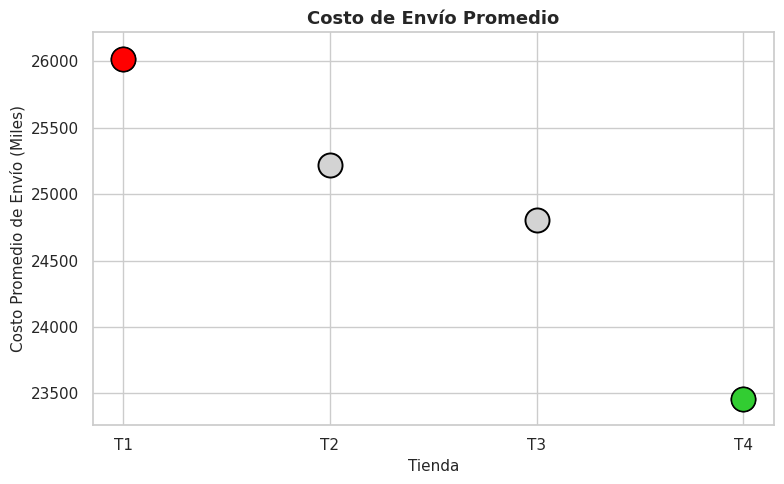

In [76]:
def graficar_costo_envio_promedio(df: pd.DataFrame) -> None:
  df = df.copy()
  df["Etiqueta"] = df["Tienda"].apply(lambda x: f"T{int(x)}")
  tienda_max = df.loc[df["Costo_envio_promedio"].idxmax(), "Etiqueta"]
  tienda_min = df.loc[df["Costo_envio_promedio"].idxmin(), "Etiqueta"]
  plt.figure(figsize=(8,5))
  sns.set(style="whitegrid")

  sns.scatterplot(
    data=df,
    x="Etiqueta",
    y="Costo_envio_promedio",
    s=300,
    color="lightgray",
    edgecolor="black",
    zorder=3
  )

  plt.scatter(
    df.loc[df["Etiqueta"] == tienda_max, "Etiqueta"],
    df.loc[df["Etiqueta"] == tienda_max, "Costo_envio_promedio"],
    s=300,
    color="red",
    edgecolors="black",
    zorder=5
  )

  plt.scatter(
    df.loc[df["Etiqueta"] == tienda_min, "Etiqueta"],
    df.loc[df["Etiqueta"] == tienda_min, "Costo_envio_promedio"],
    s=300,
    color="limegreen",
    edgecolors="black",
    zorder=5
  )

  y_min = df["Costo_envio_promedio"].min() - 200
  y_max = df["Costo_envio_promedio"].max() + 200
  plt.ylim(y_min, y_max)

  plt.title(
    "Costo de Envío Promedio",
    fontsize=13, weight="bold"
  )

  plt.xlabel("Tienda", fontsize=11)
  plt.ylabel("Costo Promedio de Envío (Miles)", fontsize=11)
  plt.tight_layout()

  plt.show()

graficar_costo_envio_promedio(df_costo)

----------

In [77]:
df_rendimiento = pd.merge(
    ingreso_por_tienda[["Tienda", "Ingreso"]],
    df_costo[["Tienda", "Costo_envio_total"]],
    on="Tienda",
    how="inner"
)

df_rendimiento["Rendimiento"] = df_rendimiento["Ingreso"] - df_rendimiento["Costo_envio_total"]
df_rendimiento = df_rendimiento.round(3)
df_rendimiento

,Tienda,Ingreso,Costo_envio_total,Rendimiento
0,1,"1,150,880,400","61,377,900","1,089,502,500"
1,2,"1,116,343,500","59,485,100","1,056,858,400"
2,3,"1,098,019,600","58,516,600","1,039,503,000"
3,4,"1,038,375,700","55,317,400","983,058,300"


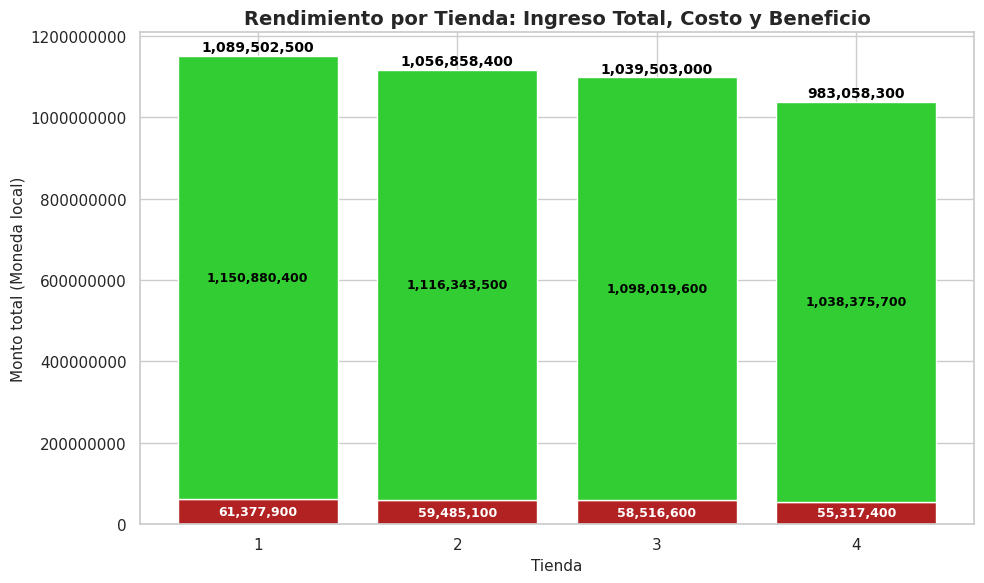

In [78]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def graficar_rendimiento_tiendas(df: pd.DataFrame) -> None:
  sns.set(style="whitegrid")
  plt.figure(figsize=(10,6))

  plt.bar(
    df["Tienda"],
    df["Costo_envio_total"],
    color="firebrick"
  )

  plt.bar(
    df["Tienda"],
    df["Rendimiento"],
    bottom=df["Costo_envio_total"],
    color="limegreen"
  )

  for i, row in df.iterrows():
    plt.text(
      row["Tienda"],
      row["Costo_envio_total"] / 2,
      f"{row['Costo_envio_total']:,.0f}",
      ha="center",
      va="center",
      color="white",
      fontsize=9,
      weight="bold"
    )

    ingreso_total = row["Ingreso"]
    plt.text(
      row["Tienda"],
      row["Costo_envio_total"] + row["Rendimiento"] / 2,
      f"{ingreso_total:,.0f}",
      ha="center",
      va="center",
      color="black",
      fontsize=9,
      weight="bold"
    )

    plt.text(
      row["Tienda"],
      row["Costo_envio_total"] + row["Rendimiento"] + (0.01 * df["Ingreso"].max()),
      f"{row['Rendimiento']:,.0f}",
      ha="center",
      fontsize=10,
      weight="bold",
      color="black"
    )

  plt.title("Rendimiento por Tienda: Ingreso Total, Costo y Beneficio", fontsize=14, weight="bold")
  plt.xlabel("Tienda", fontsize=11)
  plt.ylabel("Monto total (Moneda local)", fontsize=11)
  plt.xticks(df["Tienda"], [str(int(t)) for t in df["Tienda"]])
  ax = plt.gca()
  ax.ticklabel_format(style='plain', axis='y')
  ax.get_yaxis().get_major_formatter().set_useOffset(False)
  plt.tight_layout()

  plt.show()


graficar_rendimiento_tiendas(df_rendimiento)


# 7. Informe

In [79]:
from IPython.display import Markdown, display
import textwrap

def generar_informe_venta_tienda(ingreso_por_tienda, df_costo, calificaciones, df_rendimiento):
  display(Markdown("## 🧾 Informe Analítico: Evaluación de Tiendas para Posible Venta"))
  display(Markdown("---"))

  display(Markdown("### 💰 Ingresos Totales por Tienda"))
  graficar_ingreso_por_tienda(ingreso_por_tienda)

  display(Markdown("### ⭐ Calificaciones Promedio por Tienda"))
  graficar_satisfaccion_tiendas(calificaciones)

  display(Markdown("### 🚚 Costos Promedio de Envío por Tienda"))
  graficar_costo_envio_promedio(df_costo)

  display(Markdown("### 📈 Rendimiento por Tienda (Ingresos - Costos)"))
  graficar_rendimiento_tiendas(df_rendimiento)

  display(Markdown("## 🧠 Análisis Estratégico y Conclusiones"))
  tienda_mayor_ingreso = ingreso_por_tienda.loc[ingreso_por_tienda["Ingreso"].idxmax(), "Tienda"]
  tienda_menor_ingreso = ingreso_por_tienda.loc[ingreso_por_tienda["Ingreso"].idxmin(), "Tienda"]
  tienda_mayor_costo = df_costo.loc[df_costo["Costo_envio_total"].idxmax(), "Tienda"]
  tienda_menor_costo = df_costo.loc[df_costo["Costo_envio_total"].idxmin(), "Tienda"]
  tienda_mayor_satisfaccion = calificaciones.loc[calificaciones["Calificación_promedio"].idxmax(), "Tienda"]
  tienda_menor_satisfaccion = calificaciones.loc[calificaciones["Calificación_promedio"].idxmin(), "Tienda"]
  tienda_mayor_rendimiento = df_rendimiento.loc[df_rendimiento["Rendimiento"].idxmax(), "Tienda"]
  tienda_menor_rendimiento = df_rendimiento.loc[df_rendimiento["Rendimiento"].idxmin(), "Tienda"]

  conclusion = """
    **Resumen de hallazgos principales:**
    - 💸 **Mayor ingreso:** Tienda {tienda_mayor_ingreso}
    - 📉 **Menor ingreso:** Tienda {tienda_menor_ingreso}
    - 🚚 **Mayor costo logístico:** Tienda {tienda_mayor_costo}
    - 💰 **Menor costo logístico:** Tienda {tienda_menor_costo}
    - ⭐ **Mayor satisfacción:** Tienda {tienda_mayor_satisfaccion}
    - ⚠️ **Menor satisfacción:** Tienda {tienda_menor_satisfaccion}
    - 📈 **Mayor rendimiento (Ingreso - Costo):** Tienda {tienda_mayor_rendimiento}
    - 📉 **Menor rendimiento:** Tienda {tienda_menor_rendimiento}

    ---

    **Interpretación y decisión según el objetivo de venta:**

    - 🟢 **Si el objetivo del dueño es obtener liquidez sin afectar la rentabilidad global**,
      la mejor opción sería **vender la Tienda {tienda_menor_rendimiento}**,
      ya que presenta el menor beneficio neto frente a sus costos operativos.

    - 💙 **Si el criterio es la satisfacción del cliente**,
      la **Tienda {tienda_menor_satisfaccion}** podría ser la candidata,
      dado que su nivel de calificación promedio es el más bajo,
      lo cual podría impactar negativamente en la reputación a largo plazo.

    - 🔴 **Si el dueño desea reducir gastos logísticos**,
      la **Tienda {tienda_mayor_costo}** debería considerarse para la venta,
      ya que genera los mayores costos de envío.

    - 🟡 **Por el contrario**, si busca maximizar capital al vender el activo más valioso,
      **vender la Tienda {tienda_mayor_ingreso}** podría ser estratégico,
      aunque esto implicaría desprenderse de su tienda más rentable.

    ---

    En conclusión, **la decisión depende del propósito del propietario**:
    - Si busca eficiencia → vender **Tienda {tienda_menor_rendimiento}**
    - Si busca mejorar imagen → vender **Tienda {tienda_menor_satisfaccion}**
    - Si busca reducir costos → vender **Tienda {tienda_mayor_costo}**
    - Si busca capital inmediato → vender **Tienda {tienda_mayor_ingreso}**
  """

  conclusion = conclusion.format(
    tienda_mayor_ingreso=int(tienda_mayor_ingreso),
    tienda_menor_ingreso=int(tienda_menor_ingreso),
    tienda_mayor_costo=int(tienda_mayor_costo),
    tienda_menor_costo=int(tienda_menor_costo),
    tienda_mayor_satisfaccion=int(tienda_mayor_satisfaccion),
    tienda_menor_satisfaccion=int(tienda_menor_satisfaccion),
    tienda_mayor_rendimiento=int(tienda_mayor_rendimiento),
    tienda_menor_rendimiento=int(tienda_menor_rendimiento)
  )

  display(Markdown(textwrap.dedent(conclusion)))
  return textwrap.dedent(conclusion)

## 🧾 Informe Analítico: Evaluación de Tiendas para Posible Venta

---

### 💰 Ingresos Totales por Tienda

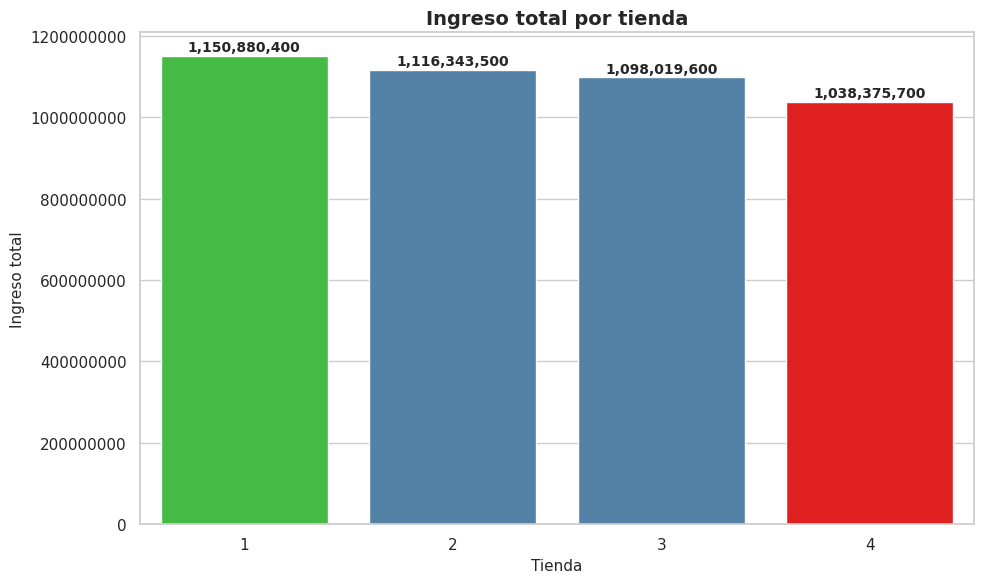

### ⭐ Calificaciones Promedio por Tienda

### 🚚 Costos Promedio de Envío por Tienda

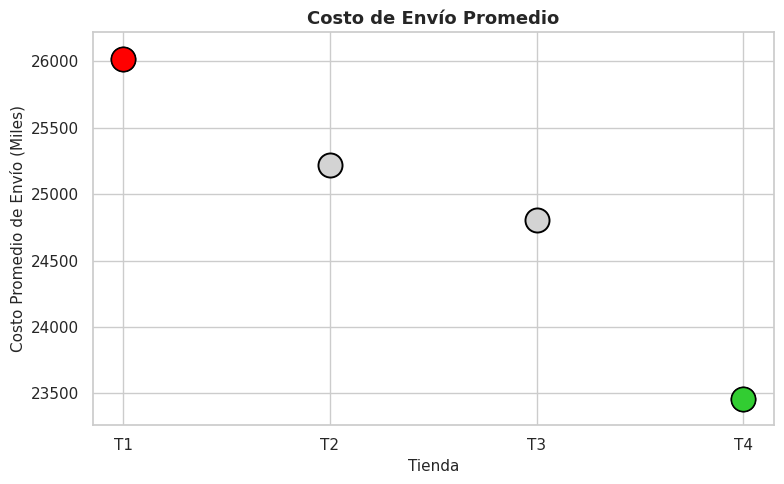

### 📈 Rendimiento por Tienda (Ingresos - Costos)

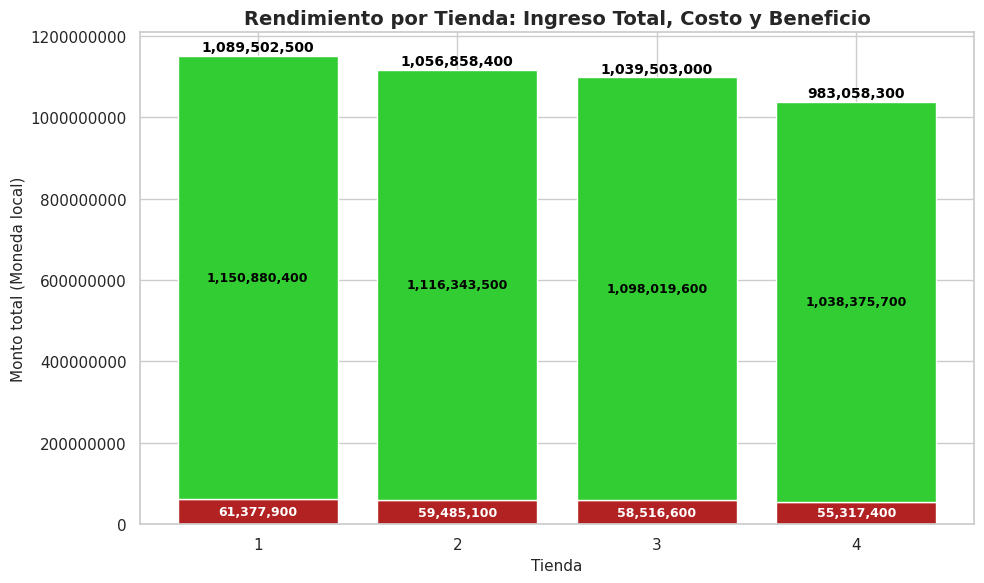

## 🧠 Análisis Estratégico y Conclusiones


**Resumen de hallazgos principales:**
- 💸 **Mayor ingreso:** Tienda 1
- 📉 **Menor ingreso:** Tienda 4
- 🚚 **Mayor costo logístico:** Tienda 1
- 💰 **Menor costo logístico:** Tienda 4
- ⭐ **Mayor satisfacción:** Tienda 3
- ⚠️ **Menor satisfacción:** Tienda 1
- 📈 **Mayor rendimiento (Ingreso - Costo):** Tienda 1
- 📉 **Menor rendimiento:** Tienda 4

---

**Interpretación y decisión según el objetivo de venta:**

- 🟢 **Si el objetivo del dueño es obtener liquidez sin afectar la rentabilidad global**,  
  la mejor opción sería **vender la Tienda 4**,  
  ya que presenta el menor beneficio neto frente a sus costos operativos.

- 💙 **Si el criterio es la satisfacción del cliente**,  
  la **Tienda 1** podría ser la candidata,  
  dado que su nivel de calificación promedio es el más bajo,  
  lo cual podría impactar negativamente en la reputación a largo plazo.

- 🔴 **Si el dueño desea reducir gastos logísticos**,  
  la **Tienda 1** debería considerarse para la venta,  
  ya que genera los mayores costos de envío.

- 🟡 **Por el contrario**, si busca maximizar capital al vender el activo más valioso,  
  **vender la Tienda 1** podría ser estratégico,  
  aunque esto implicaría desprenderse de su tienda más rentable.

---

En conclusión, **la decisión depende del propósito del propietario**:
- Si busca eficiencia → vender **Tienda 4**
- Si busca mejorar imagen → vender **Tienda 1**
- Si busca reducir costos → vender **Tienda 1**
- Si busca capital inmediato → vender **Tienda 1**


'\n**Resumen de hallazgos principales:**\n- 💸 **Mayor ingreso:** Tienda 1\n- 📉 **Menor ingreso:** Tienda 4\n- 🚚 **Mayor costo logístico:** Tienda 1\n- 💰 **Menor costo logístico:** Tienda 4\n- ⭐ **Mayor satisfacción:** Tienda 3\n- ⚠️ **Menor satisfacción:** Tienda 1\n- 📈 **Mayor rendimiento (Ingreso - Costo):** Tienda 1\n- 📉 **Menor rendimiento:** Tienda 4\n\n---\n\n**Interpretación y decisión según el objetivo de venta:**\n\n- 🟢 **Si el objetivo del dueño es obtener liquidez sin afectar la rentabilidad global**,  \n  la mejor opción sería **vender la Tienda 4**,  \n  ya que presenta el menor beneficio neto frente a sus costos operativos.\n\n- 💙 **Si el criterio es la satisfacción del cliente**,  \n  la **Tienda 1** podría ser la candidata,  \n  dado que su nivel de calificación promedio es el más bajo,  \n  lo cual podría impactar negativamente en la reputación a largo plazo.\n\n- 🔴 **Si el dueño desea reducir gastos logísticos**,  \n  la **Tienda 1** debería considerarse para la venta

In [80]:
report = generar_informe_venta_tienda(
    ingreso_por_tienda=ingreso_por_tienda,
    df_costo=df_costo,
    calificaciones=calificaciones,
    df_rendimiento=df_rendimiento
)

report

# 8. Extra

In [81]:
import folium
from folium.plugins import MarkerCluster

def visualizar_mapa_cluster_tiendas(df: pd.DataFrame) -> folium.Map:
  df = df.copy()
  df["Tienda"] = df["Tienda"].astype(str).str.strip().str.title()
  centro_lat = df["lat"].mean()
  centro_lon = df["lon"].mean()
  mapa = folium.Map(location=[centro_lat, centro_lon], zoom_start=5, tiles="CartoDB positron")

  for tienda, datos in df.groupby("Tienda"):
    grupo = MarkerCluster(name=tienda).add_to(mapa)

    for _, fila in datos.iterrows():
      folium.CircleMarker(
        location=[fila["lat"], fila["lon"]],
        radius=4,
        fill=True,
        fill_opacity=0.7,
        popup=(
          f"<b>Tienda:</b> {tienda}<br>"
          f"<b>Ciudad:</b> {fila.get('Lugar de Compra', 'N/A')}<br>"
          f"<b>Producto:</b> {fila.get('Producto', 'N/A')}<br>"
          f"<b>Precio:</b> ${fila.get('Precio', 0):,.2f}"
        ),
      ).add_to(grupo)

  folium.LayerControl().add_to(mapa)
  return mapa

mapa_clusters = visualizar_mapa_cluster_tiendas(df_unificado)
mapa_clusters